___

<a href='http://www.pieriandata.com'><img src='../Pierian_Data_Logo.png'/></a>
___
<center><em>Copyright by Pierian Data Inc.</em></center>
<center><em>For more information, visit us at <a href='http://www.pieriandata.com'>www.pieriandata.com</a></em></center>

# K Means Color Quantization

### Imports


In [1]:
import numpy as np

import matplotlib.image as mpimg
import matplotlib.pyplot as plt

### The Image

In [2]:
image_as_array = mpimg.imread('../DATA/palm_trees.jpg')

In [3]:
image_as_array # RGB CODES FOR EACH PIXEL

array([[[ 25,  89, 127],
        [ 25,  89, 127],
        [ 25,  89, 127],
        ...,
        [ 23,  63,  98],
        [ 51,  91, 127],
        [ 50,  90, 126]],

       [[ 25,  89, 127],
        [ 25,  89, 127],
        [ 25,  89, 127],
        ...,
        [ 31,  71, 106],
        [ 48,  88, 124],
        [ 47,  90, 125]],

       [[ 25,  89, 127],
        [ 25,  89, 127],
        [ 25,  89, 127],
        ...,
        [ 39,  79, 114],
        [ 42,  85, 120],
        [ 44,  88, 123]],

       ...,

       [[  4,   4,   6],
        [  4,   4,   6],
        [  4,   4,   6],
        ...,
        [  9,   9,  11],
        [  9,   9,  11],
        [  9,   9,  11]],

       [[  3,   3,   5],
        [  3,   3,   5],
        [  3,   3,   5],
        ...,
        [  8,   8,  10],
        [  8,   8,  10],
        [  8,   8,  10]],

       [[  4,   4,   6],
        [  4,   4,   6],
        [  4,   4,   6],
        ...,
        [  9,   9,  11],
        [ 10,  10,  12],
        [ 10,  10,  12]]

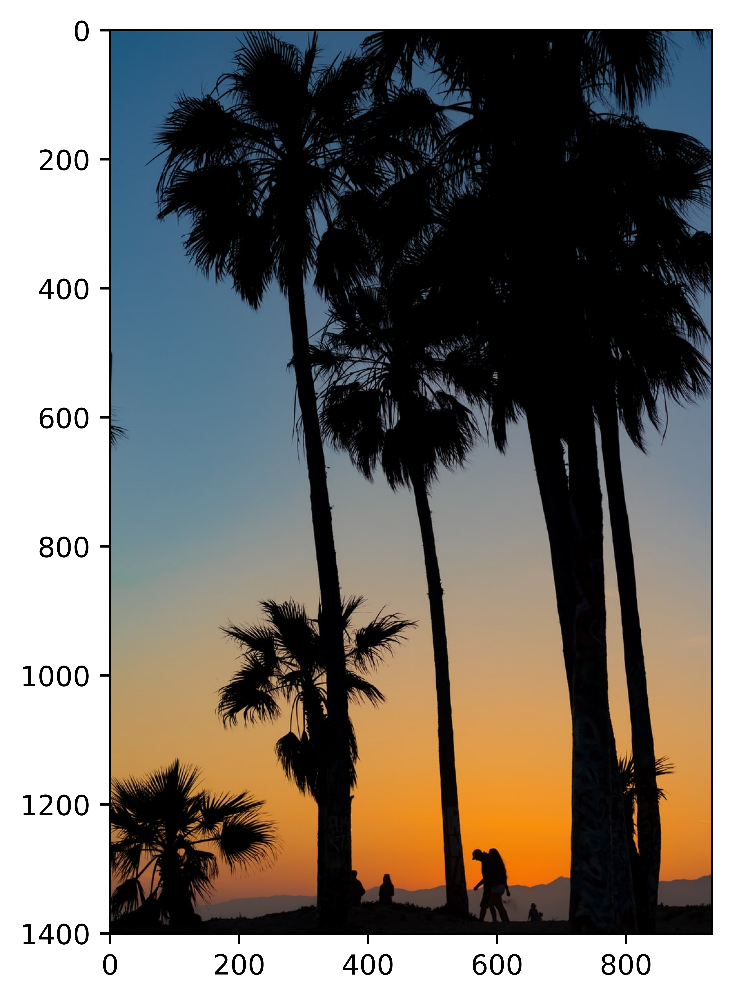

In [4]:
plt.figure(figsize=(6,6),dpi=900)
plt.imshow(image_as_array)

## Using Kmeans to Quantize Colors

Quantizing colors means we'll reduce the number of unique colors here to K unique colors. Let's try just 6 colors!

In [5]:
image_as_array.shape
# (h,w,3 color channels)

(1401, 934, 3)

### Convert from 3d to 2d

Kmeans is designed to train on 2D data (data rows and feature columns), so we can reshape the above strip by using (h,w,c) ---> (h * w,c)

In [6]:
(h,w,c) = image_as_array.shape

In [7]:
image_as_array2d = image_as_array.reshape(h*w,c)

In [8]:
from sklearn.cluster import KMeans

In [9]:
model = KMeans(n_clusters=9)

In [10]:
model

KMeans(n_clusters=9)

In [11]:
labels = model.fit_predict(image_as_array2d)

In [12]:
labels

array([7, 7, 7, ..., 0, 0, 0])

In [13]:
# THESE ARE THE 6 RGB COLOR CODES!
model.cluster_centers_

array([[  2.57907582,   2.35200218,   3.42519366],
       [177.11178937, 154.78209397, 125.96298645],
       [ 91.86066508, 124.41979177, 145.94518975],
       [228.30236653, 135.14634426,  35.77515784],
       [ 57.26943333,  55.12490596,  58.07502483],
       [138.09952495, 144.65587531, 145.18837109],
       [208.72754741, 153.6494364 ,  87.33323838],
       [ 56.53539629,  96.31331098, 128.25755124],
       [150.98948885,  96.51352824,  58.85938412]])

In [14]:
rgb_codes = model.cluster_centers_.round(0).astype(int)

In [15]:
rgb_codes

array([[  3,   2,   3],
       [177, 155, 126],
       [ 92, 124, 146],
       [228, 135,  36],
       [ 57,  55,  58],
       [138, 145, 145],
       [209, 154,  87],
       [ 57,  96, 128],
       [151,  97,  59]])

In [16]:
quantized_image = np.reshape(rgb_codes[labels], (h, w, c))

In [17]:
quantized_image

array([[[ 57,  96, 128],
        [ 57,  96, 128],
        [ 57,  96, 128],
        ...,
        [ 57,  55,  58],
        [ 57,  96, 128],
        [ 57,  96, 128]],

       [[ 57,  96, 128],
        [ 57,  96, 128],
        [ 57,  96, 128],
        ...,
        [ 57,  96, 128],
        [ 57,  96, 128],
        [ 57,  96, 128]],

       [[ 57,  96, 128],
        [ 57,  96, 128],
        [ 57,  96, 128],
        ...,
        [ 57,  96, 128],
        [ 57,  96, 128],
        [ 57,  96, 128]],

       ...,

       [[  3,   2,   3],
        [  3,   2,   3],
        [  3,   2,   3],
        ...,
        [  3,   2,   3],
        [  3,   2,   3],
        [  3,   2,   3]],

       [[  3,   2,   3],
        [  3,   2,   3],
        [  3,   2,   3],
        ...,
        [  3,   2,   3],
        [  3,   2,   3],
        [  3,   2,   3]],

       [[  3,   2,   3],
        [  3,   2,   3],
        [  3,   2,   3],
        ...,
        [  3,   2,   3],
        [  3,   2,   3],
        [  3,   2,   3]]

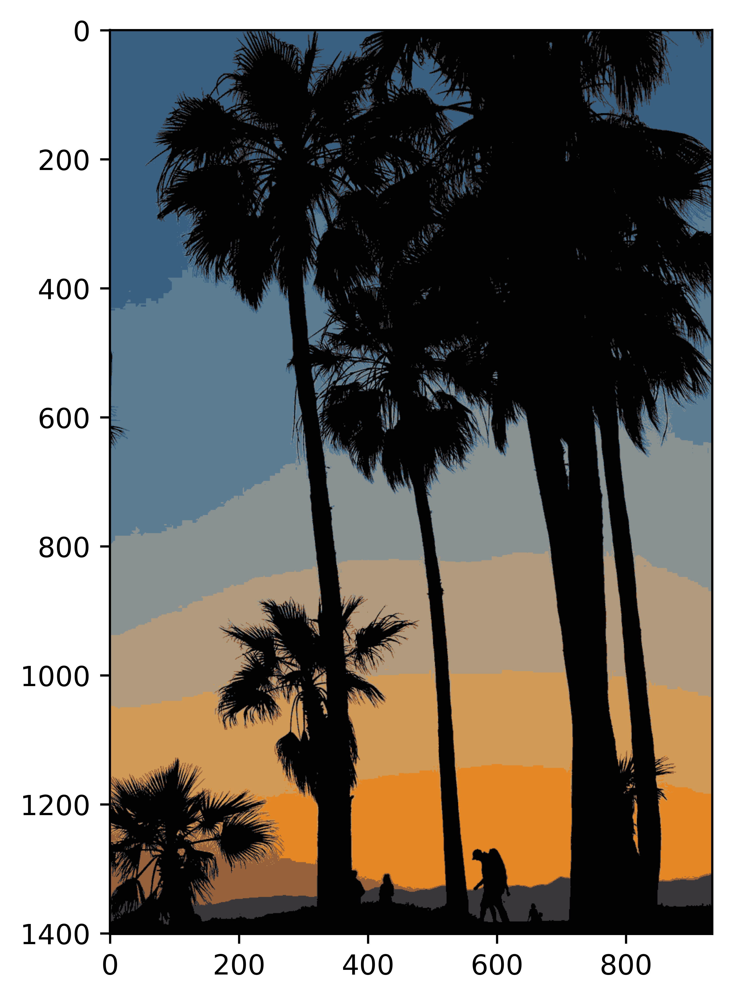

In [18]:
plt.figure(figsize=(6,6),dpi=900)
plt.imshow(quantized_image)